# [Bacterial Colony Growth](@id Bacteries)

In this example, we are going to create a bacterial model and grow a colony using it.

 - The implementation of the force interaction dynamics is the one presented by [Volfson et al. (2008)](https://www.pnas.org/doi/abs/10.1073/pnas.0706805105)
 - We use GPU accelerated dynamics

As described in other models, it is advised that the models are constructed by parts to avoid having to find bugs in a very complex system. Hence, we will split the model in two parts:

 - Forces model
 - Growth model

## Load the packages

In [35]:
using Base.Threads
println("Usando ", nthreads(), " threads 😎")

Usando 4 threads 😎


In [36]:
# import Pkg
# Pkg.activate("../")
# Pkg.instantiate()


In [37]:
# import Pkg; Pkg.add(["Revise", "GLMakie"])

In [38]:
# using Revise
# using CellBasedModels
# using CUDA
# using Distributions
# using GLMakie
# # using GeometryBasics
# import GLMakie: Point3f, Cylinder, Sphere, NoShading #Can be changes to Cairo or CLMakie

In [39]:
import Pkg

# Activa el entorno del proyecto
# Pkg.activate("C:/Users/julia/OneDrive/Escritorio/phd/Bacteria_ABM/ABM_CBM/")

Pkg.activate("/home/julia/Escritorio/Projects/Pushing/ABM_CBM")
# Pkg.activate("C:/Users/julia/OneDrive/Escritorio/phd/Bacteria_ABM/ABM_CBM/")


# Resuelve y asegura dependencias
Pkg.resolve()
Pkg.instantiate()


# Carga los paquetes de forma ordenada
using Revise
using CellBasedModels
ENV["JULIA_CUDA_USE_BINARYBUILDER"] = false  # (opcional, fuerza compilación local)
using CUDA
CUDA.set_runtime_version!(v"12.2")
using Distributions
using CairoMakie
using JSON

# Importa funciones específicas después
import CairoMakie: Point3f, Cylinder, Sphere, NoShading

CairoMakie.activate!()


  Activating project at `~/Escritorio/Projects/Pushing/ABM_CBM`
  No Changes to `~/Escritorio/Projects/Pushing/ABM_CBM/Project.toml`
  No Changes to `~/Escritorio/Projects/Pushing/ABM_CBM/Manifest.toml`
Precompiling packages...
  12108.6 ms  ? CellBasedModels
┌ Info: Configure the active project to use CUDA 12.2; please re-start Julia for this to take effect.
└ @ CUDA /home/julia/.julia/packages/CUDA/jdJ7Z/lib/cudadrv/version.jl:82


In [40]:
# import Pkg
# Pkg.activate("/home/julia/Escritorio/Projects/Pushing/ABM_CBM")
# Pkg.update()              # Alinea versiones del stack SciML (ver punto 2)
# Pkg.precompile()

# # using Revise
# # using CellBasedModels
# # using CUDA                # <- comentar por ahora
# # CUDA.set_runtime_version!(v"12.2")  # <- comentar
# # ENV["JULIA_CUDA_USE_BINARYBUILDER"] = false  # <- comentar

# using Revise
# using CellBasedModels
# using Distributions
# using CairoMakie
# using JSON
# CairoMakie.activate!()


## Forces model

We already use the defined forces model that is implemented in CBqodels. This is an exact copy of the rod model that you can find already predefined in `Models/rods.jl`. You can check the `Models` section of the documentation for more details.


In [41]:
rod2D = ABM(2,
    agent = Dict(
            :theta=>Float64,
            :d=>Float64,
            :l=>Float64,
            :fx=>Float64,
            :fy=>Float64,
            :W=>Float64,
        ),    #Local Interaction Parameters

    model = Dict(
            :E=>Float64,
            :eta=>Float64,

        ),        #Global parameters

    agentODE = quote

        fx = 0
        fy = 0
        W = 0
        @loopOverNeighbors i2 begin

            #Use the model provided in the documentation
            Fijx, Fijy, Wij = CBMModels.repulsiveForces_rods(x,y,d,l,theta,
                                    x[i2],y[i2],d[i2],l[i2],theta[i2],eta, E)

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            W += Wij
            
        end

        #Equations
        dt(x) =  fx 
        dt(y) =  fy 
        dt(theta) =  W
    end,

    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=4),
    platform=CPU(),
    agentAlg = CBMIntegrators.Heun()
);


### Initialize a coqunity with two bacteries and check forces

In [42]:
com = Community(rod2D,
            N=30,
            dt=0.0001,
            simBox = [-10 10;-10 10.],
            );


#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um


com.E=1* 1.E6 *m/(t^2*d) #Pa
com.eta = 200 *m/(t^2*d) #Pa h
 

com.d = 1.        
com.l = 3.99      



com.x = 0
com.y = 0
com.theta = 0;


In [43]:
com.N

30

In [44]:
for i in 1:com.N
    com.theta[i] = rand() * 2π
    com.x[i] = rand()*10-5
    com.y[i] = rand()*10-5
    com.l[i] = 3.0
    com.d[i] = 1.0

end

In [45]:
com.theta[1]=20

20

In [46]:
evolve!(com,steps=10000,saveEach=100,preallocateAgents=com.N)

In [47]:
function plotAgents2D!(ax, x, y, d, l, angle, p; colormap=:inferno, kargs...)
    for (xi, yi, li, di, ai, pi) in zip(x, y, l, d, angle, p)



            colorval = pi
            # colormap = :inferno
            meshscatter!(ax,
                [xi + li/2 * cos(ai)],
                [yi + li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [colorval],
                colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi - li/2 * cos(ai)],
                [yi - li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [colorval],
                colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi],
                [yi];
                marker = Cylinder(Point3f(-.5, 0, 0), Point3f(.5, 0, 0), Float32(1)),
                markersize = [Point3f(li, di/2, di/2)],
                rotation = [ai],
                color = [colorval],
                colormap = colormap,
                kargs...
            )

    end
    return
end


plotAgents2D! (generic function with 1 method)

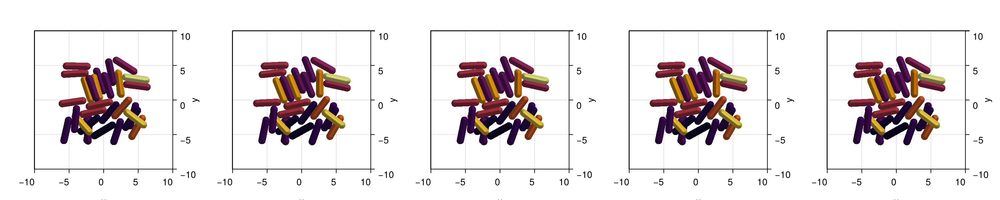

CairoMakie.Screen{IMAGE}


In [48]:
fig = Figure(size=(1500,300))

for (i,j) in enumerate([1:round(Int,length(com)/4):length(com);length(com)])
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents2D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:theta],
    colorrange = (0, 2*pi)
)

    xlims!(-10,10)
    ylims!(-10,10)
end

display(fig)

In [49]:

function log_community_state(parameters::OrderedDict, t::Int, path::String )
    # Convert keys to strings so JSON can serialize them
    string_keys = Dict(string(k) => v for (k, v) in parameters)
    # Build entry
    entry = Dict("t" => t, "parameters" => string_keys)
    # Save as a JSON line
    open(path, "a") do io
        println(io, JSON.json(entry))
    end
end


function load_parameters_log(path::String )
    log = Dict{Int, OrderedDict{Symbol, Any}}()
    for line in eachline(path)
        entry = JSON.parse(line)
        t = entry["t"]
        raw_params = entry["parameters"]
        params = OrderedDict(Symbol(k) => v for (k, v) in raw_params)
        log[t] = params
    end
    times = sort(collect(keys(log)))
    com_array = [log[t] for t in times]
    return com_array, times
end



load_parameters_log (generic function with 1 method)

In [50]:
function plotAgents3D!(ax, x, y, z, d, l, theta, phi, p; colormap=:inferno, kargs...)
    # Recomendado: en tu Axis3 usa aspect=:data para evitar distorsión de ejes
    # ej.: ax = Axis3(fig[1,1]; aspect=:data)

    for (xi, yi, zi, di, li, thetai, phii, pi) in zip(x, y, z, d, l, theta, phi, p)
        # Dirección unitaria u(θ,φ)
        ux = cos(thetai) * cos(phii)
        uy = sin(thetai) * cos(phii)
        uz = sin(phii)

        # Polos (extremos)
        x_plus  = xi + 0.5 * li * ux
        y_plus  = yi + 0.5 * li * uy
        z_plus  = zi + 0.5 * li * uz

        x_minus = xi - 0.5 * li * ux
        y_minus = yi - 0.5 * li * uy
        z_minus = zi - 0.5 * li * uz

        r = Float32(di/2)

        # Color: usa tu escalar 'pi' con colormap (fija un rango 0..1; ajusta si necesitas)
        colorrange = (0.0, 1.0)
        # Cilindro que UNE los polos (Makie lo orienta solo con p1->p2)


        # Esferas en los polos
        mesh!(ax, Sphere(Point3f(x_plus,  y_plus,  z_plus),  r);
             color=pi, colormap=colormap, colorrange=colorrange, kargs...)
        mesh!(ax, Sphere(Point3f(x_minus, y_minus, z_minus), r);
             color=pi, colormap=colormap, colorrange=colorrange, kargs...)
        mesh!(ax, Cylinder(
            Point3f(x_minus, y_minus, z_minus),
            Point3f(x_plus,  y_plus,  z_plus),
            r);
            color=pi, colormap=colormap, colorrange=colorrange, kargs...)


    end
    return
end


plotAgents3D! (generic function with 1 method)

In [51]:
# using GeometryBasics, Makie

view_dir(az, el) = Vec3f(cos(az)*cos(el), sin(az)*cos(el), sin(el))

function painter_perm(ax::Axis3, x, y, z)
    az = ax.azimuth[]; el = ax.elevation[]
    v  = view_dir(az, el)
    depths = x .* v[1] .+ y .* v[2] .+ z .* v[3]
    sortperm(depths; rev=false)  # far → near (lejos → cerca)
end

function plotAgents3D_auto!(ax, x, y, z, d, l, theta, phi, p; colormap=:inferno, colorrange=(0,1), kwargs...)
    perm = painter_perm(ax, x, y, z)
    for i in perm
        xi, yi, zi = x[i], y[i], z[i]
        di, li = d[i], l[i]
        thetai, phii, pi = theta[i], phi[i], p[i]

        ux = cos(thetai) * cos(phii)
        uy = sin(thetai) * cos(phii)
        uz = sin(phii)

        x_plus  = xi + 0.5li*ux; y_plus  = yi + 0.5li*uy; z_plus  = zi + 0.5li*uz
        x_minus = xi - 0.5li*ux; y_minus = yi - 0.5li*uy; z_minus = zi - 0.5li*uz
        r = Float32(di/2)

        mesh!(ax, Sphere(Point3f(x_plus,  y_plus,  z_plus),  r);
             color=pi, colormap=colormap, colorrange=colorrange, kwargs...)
        mesh!(ax, Sphere(Point3f(x_minus, y_minus, z_minus), r);
             color=pi, colormap=colormap, colorrange=colorrange, kwargs...)
        mesh!(ax, Cylinder(Point3f(x_minus, y_minus, z_minus), Point3f(x_plus, y_plus, z_plus), r);
             color=pi, colormap=colormap, colorrange=colorrange, kwargs...)

    end
    return
end


function plotAgents3Drod!(ax, x, y, z, d, l, theta, phi, p; colormap=:inferno, colorrange=(0,1), kwargs...)
    perm = painter_perm(ax, x, y, z)
    for i in perm
        xi, yi, zi = x[i], y[i], z[i]
        di, li = d[i], l[i]
        thetai, phii, pi = theta[i], phi[i], p[i]

        ux = cos(thetai) * cos(phii)
        uy = sin(thetai) * cos(phii)
        uz = sin(phii)

        x_plus  = xi + 0.5li*ux; y_plus  = yi + 0.5li*uy; z_plus  = zi + 0.5li*uz
        x_minus = xi - 0.5li*ux; y_minus = yi - 0.5li*uy; z_minus = zi - 0.5li*uz
        r = Float32(di/2)


        mesh!(ax, Cylinder(Point3f(x_minus, y_minus, z_minus), Point3f(x_plus, y_plus, z_plus), r);
             color=pi, colormap=colormap, colorrange=colorrange, kwargs...)

    end
    return
end


plotAgents3Drod! (generic function with 1 method)

# Terracing


In [52]:
@inline function rod_poles3d_ordered(x,y,z,l,theta,phi)
    ux,uy,uz = rod_dir3d(theta, phi)
    hx,hy,hz = 0.5l*ux, 0.5l*uy, 0.5l*uz
    return (x+hx, y+hy, z+hz), (x-hx, y-hy, z-hz)  # (+, −)
end

rod_poles3d_ordered (generic function with 1 method)

In [53]:
@inline function rod_dir3d(theta, phi)
    cx = cos(theta); sx = sin(theta)
    cp = cos(phi);   sp = sin(phi)
    return (cx*cp, sx*cp, sp)               # u = (cosθ cosφ, sinθ cosφ, sinφ)
end


rod_dir3d (generic function with 1 method)

In [83]:
rod3D_grow = ABM(3,
    agent = Dict(
            :theta=>Float64,
            :phi =>Float64,
            :d=>Float64,
            :l=>Float64,
            :fx=>Float64,
            :fy=>Float64,
            :fz=>Float64,
            :Wtheta=>Float64,
            :Wphi=>Float64,
            :lTarget => Float64,
            :V => Float64,
            :g => Float64,
            :noise => Float64,

        ),    #Local Interaction Parameters

    model = Dict(
            :Ebb =>Float64,
            :eta =>Float64,
            :eps =>Float64,
            :gamma =>Float64,
            :lMax => Float64,
            :σlTarget => Float64,
            :Ebv => Float64,
            :h0 => Float64,
            :Ebp => Float64,
            :alpha_HP =>Float64,
            :K_HP =>Float64,
            :D_HP =>Float64,
            :Kc =>Float64,
            :beta_c =>Float64,
            :D_c =>Float64,
            :c0 =>Float64,
            :gamma_c => Float64,
            :eps_cs =>Float64,
            :gamma_cs =>Float64,
            :D_PGA =>Float64,
            :alpha_PGA =>Float64,
            :KpqC =>Float64,
            :delta_PGA =>Float64,
            :alpha_PhrC =>Float64,
            :alpha_PhrF =>Float64,
            :D_PhrC =>Float64,
            :D_PhrF =>Float64,
            :delta_PhrC =>Float64,
            :delta_PhrF =>Float64,
            :npqC => Int,
            :alpha_V => Float64,
            :delta_V => Float64,
            :beta_V => Float64,
            :KVc => Float64,
            :nV => Int,
            :npc => Int,
            :growth=>Float64,
            :Kpc => Float64,
            :v => Float64,
            :KpqF => Float64,
            :npqF =>Int,



        ),        #Global parameters

    medium = Dict(
            :HPad => Float64,
            :PPad => Float64,
            :c => Float64,
            :PGA => Float64,
            :Hx => Float64,
            :Hy => Float64,
            :PhrC => Float64,
            :PhrF => Float64,
        ),

    agentODE = quote

        fx = 0
        fy = 0
        fz = 0
        Wtheta = 0
        Wphi = 0 
        dt(l) = g

        @loopOverNeighbors i2 begin

            # #Use the model provided in the documentation
            # Fijx, Fijy, Fijz, Wijtheta, Wijphi = CBMModels.repulsiveForces_rods3d(x,y,z,d,l,theta, phi,
            #                         x[i2],y[i2],z[i2],d[i2],l[i2],theta[i2], phi[i2], eta, Ebb)

            # #Append the repulsive forces
            # fx += Fijx
            # fy += Fijy
            # fz += Fijz
            # Wtheta += Wijtheta
            # Wphi += Wijphi

            #Use the model provided in the documentation
            Fijx, Fijy, Wijtheta = CBMModels.repulsiveForces_as_rods(x,y,d,l,theta,
                                    x[i2],y[i2],d[i2],l[i2],theta[i2], eta, Ebb,2)

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            Wtheta += Wijtheta
            
        end

        

      
        

        #Equations
        noise = CBMDistributions.uniform(-1,1)*10^(-5)/(eta*l)
        dt(x) =  fx + noise
        dt(y) =  fy + CBMDistributions.uniform(-1,1)*10^(-5)/(eta*l)
        # dt(x) =  fx 
        # dt(y) =  fy 
        dt(z) =  fz
        dt(theta) =  Wtheta
        dt(phi) = Wphi
    end,


    agentRule = quote #Bound cells

        #Add division
        if l > lTarget
            # Dirección 3D de la varilla (unitaria)
            ux = cos(theta)*cos(phi)
            uy = sin(theta)*cos(phi)
            uz = sin(phi)

            # === Hija A (delantera, +u) ===
            @addAgent(
                x = x + (l+d)/4. * ux,
                y = y + (l+d)/4. * uy,
                z = z + (l+d)/4. * uz,
                l = (l-d)/2.,
                fx=0,
                fy=0,
                Wtheta=0,
                theta = theta,
                phi = phi,
                lTarget = CBMDistributions.uniform(lMax-σlTarget, lMax+σlTarget),
                g= CBMDistributions.uniform(growth/2, 3*growth/2),
            )

            # === Hija B (trasera, −u) ===
            @addAgent(
                x = x - (l+d)/4. * ux,
                y = y - (l+d)/4. * uy,
                z = z - (l+d)/4. * uz,
                l = (l-d)/2.,
                fx=0,
                fy=0,
                Wtheta=0,
                theta = theta,
                phi = phi,
                lTarget = CBMDistributions.uniform(lMax-σlTarget, lMax+σlTarget),
                g= CBMDistributions.uniform(growth/2, 3*growth/2),
            )

            # Elimina célula madre
            @removeAgent()
        end

        # x += CBMDistributions.normal(1,0)*10^(-7)/(eta*l)*(dt)
        # y += CBMDistributions.normal(1,0)*10^(-7)/(eta*l)*(dt)
    
    end,
    


    # agentSDE = quote #Here we put the stochastic term
    #     dt(theta) = D
    # end,
    # mediumODE=quote 


    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=10),
    mediumAlg=DifferentialEquations.Euler(),
    platform=CPU(),
    agentAlg = CBMIntegrators.Heun()
);


In [84]:
com = Community(rod3D_grow,
            N=1,
            dt=5*10^(-6),
            simBox = [-100 100;-100 100.; -100 100],
            NMedium=[200,200,1],
            );


#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um


com.Ebb= 4*1.E6 *m/(t^2*d) #Pa
com.eta = 200 *m/(t^2*d) #Pa h
com.eps = 1.E3 *m/(t^2*d) #Pa um^4
# com.eps = 0 #Pa um^4
com.gamma=0.5

com.Ebv = com.Ebb *10 
com.Ebp =  com.Ebb*0.1

com.eps_cs = 5*1.E3 *m/(t^2*d) #Pa um^4
com.gamma_cs=1

com.growth = 2
com.g = 6
# com.lMax = 4.     
com.σlTarget = 0 

com.d = 1.        
com.l = 4.99      
com.lTarget = 5.  
com.lMax = 5.  
com.x=0
com.y=0
com.z=com.d/2
com.theta=0
com.phi=0



com.h0=0
com.alpha_HP=1*10^(-6)
com.K_HP=100
com.D_HP=500
com.PPad=0
com.HPad=1


com.PGA=0
com.alpha_PGA = 5
com.delta_PGA = 1
com.D_PGA = 1
com.npc = 10
com.v = 2.5*10^9
com.Kpc=0.01

com.KpqC=0.3
com.npqC=10

com.KpqF=9
com.npqF=10

com.V=1
com.alpha_V=1
com.delta_V=1
com.beta_V=2
com.KVc=0.01
com.nV=10


com.D_c = 1000
com.c0 = 1 #Medium concentration
com.c = com.c0 
com.Kc = 1 #Half saturation constant for the medium
com.beta_c = 4 #Growth rate of the cells in the medium
com.gamma_c = 5 #Decay with height constant




com.PhrC=0
com.alpha_PhrC = 1
com.delta_PhrC = 0.1
com.D_PhrC = 500 

com.PhrF=0
com.alpha_PhrF = 100
com.delta_PhrF = 10
com.D_PhrF = 50 




50

In [85]:

file="Pad.txt"

"Pad.txt"

In [86]:

file="Pad.txt"
open(file, "w") do f
    # clear file at start
end

In [87]:
prev_steps=Int(round(0/com.dt))
steps=Int(round(10/com.dt))
saveEach = Int(round(5/com.dt))/10
N=com.N*4

loadToPlatform!(com,preallocateAgents=N)

step=prev_steps
log_community_state(com.parameters, step, file)


while (step<steps+1) & (com.N < 500)
    
    step!(com)

    if step % saveEach == 0
        bringFromPlatform!(com)
        if N - com.N[1] <= 0
                println("Step ",step, " N: ", com.N[1], " preallocateAgents: ", N)
                @warn "More agents than preallocateAgents, stopping simulation."
                break
        elseif   N - com.N[1]  < 4*com.N[1]
                N = 15*com.N[1]
        end 
        println("Step ",step, " N: ", com.N[1])
        log_community_state(com.parameters, step, file)
        loadToPlatform!(com,preallocateAgents=N)
    end
    step += 1
    com.PPad=0
end
bringFromPlatform!(com)

Step 0 N: 1
Step 100000 N: 2
Step 200000 N: 2
Step 300000 N: 4
Step 400000 N: 4
Step 500000 N: 6
Step 600000 N: 6
Step 700000 N: 7
Step 800000 N: 11
Step 900000 N: 12
Step 1000000 N: 15
Step 1100000 N: 19
Step 1200000 N: 23
Step 1300000 N: 29
Step 1400000 N: 37
Step 1500000 N: 44
Step 1600000 N: 55
Step 1700000 N: 72
Step 1800000 N: 85
Step 1900000 N: 106
Step 2000000 N: 129


In [90]:
prev_steps=Int(round(10/com.dt))
steps=Int(round(25/com.dt))
saveEach = Int(round(5/com.dt))/10
N=com.N*4

loadToPlatform!(com,preallocateAgents=N)

step=prev_steps+1
log_community_state(com.parameters, step, file)


while (step<steps+1) & (com.N < 1000)
    
    step!(com)

    if step % saveEach == 0
        bringFromPlatform!(com)
        if N - com.N[1] <= 0
                println("Step ",step, " N: ", com.N[1], " preallocateAgents: ", N)
                @warn "More agents than preallocateAgents, stopping simulation."
                break
        elseif   N - com.N[1]  < 4*com.N[1]
                N = 15*com.N[1]
        end 
        println("Step ",step, " N: ", com.N[1])
        log_community_state(com.parameters, step, file)
        loadToPlatform!(com,preallocateAgents=N)
    end
    step += 1
    com.PPad=0
end
bringFromPlatform!(com)

Step 2100000 N: 165
Step 2200000 N: 202
Step 2300000 N: 255
Step 2400000 N: 317
Step 2500000 N: 388
Step 2600000 N: 474
Step 2700000 N: 595
Step 2800000 N: 743
Step 2900000 N: 940


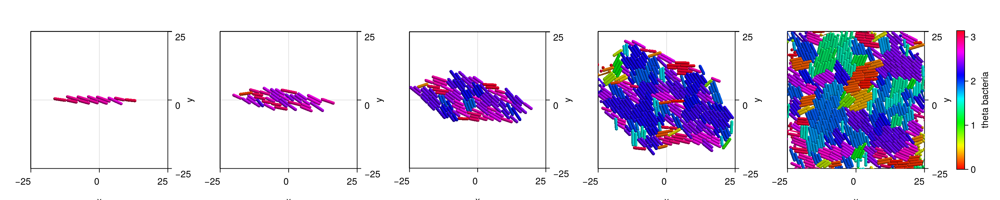

CairoMakie.Screen{IMAGE}


In [91]:
fig = Figure(size=(1500,300))
com_load, times = load_parameters_log(file)
# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
js= round.(Int, range(10, length(com_load), length=5))
for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                aspect = (1,1,0.5)
            )

    plotAgents3D_auto!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    abs.(mod.(com_load[j][:theta], π)),
    colorrange = (0, pi),
    colormap = :hsv
)

    xlims!(-25,25)
    ylims!(-25,25)
    zlims!(-10,10)
end
Colorbar(fig[1, length(js) + 1],
    colormap = :hsv,
    colorrange =(0, pi),
    label = "theta bacteria"
)

display(fig)

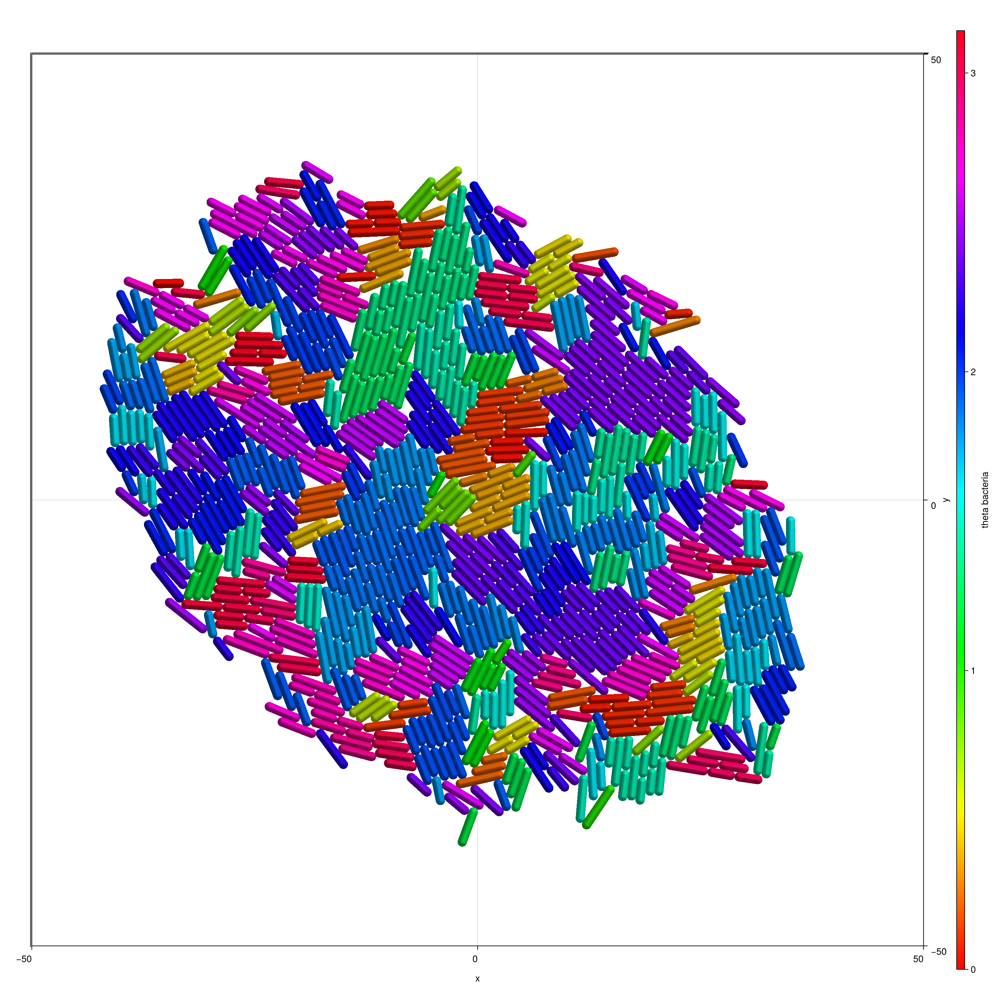

131


CairoMakie.Screen{IMAGE}


In [92]:
fig = Figure(size=(1500,1500))
com_load, times = load_parameters_log(file)
# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
js= length(com_load)
for (i,j) in enumerate(js)
    println(i, j)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                aspect = (1,1,0.5)
            )

    plotAgents3D_auto!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    abs.(mod.(com_load[j][:theta], π)),
    colorrange = (0, pi),
    colormap = :hsv
)

    xlims!(-50,50)
    ylims!(-50,50)
    zlims!(-10,10)
end
Colorbar(fig[1, length(js) + 1],
    colormap = :hsv,
    colorrange =(0, pi),
    label = "theta bacteria"
)

display(fig)

In [76]:

# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] 
ax1 = Axis3(grid[1, 1]; azimuth=3*π/2,
                elevation=-π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                aspect = (1,1,0.1))
ax1.xgridvisible = true
ax1.ygridvisible = true

Colorbar(fig[1,2],
    colormap = :hsv,
    colorrange =(0, pi),
    label = "theta bacteria"
)

Makie.record(fig, "Colony_theta.mp4", 1:1:Int(length(com_load)); framerate = 10) do j
 
    Makie.empty!(ax1)

    plotAgents3D_auto!(
    ax1,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    abs.(mod.(com_load[j][:theta], π)),
    colorrange = (0, pi),
    colormap = :hsv
)


    xlims!(-50,50)
    ylims!(-50,50)
    zlims!(-10,10)

end



"Colony_theta.mp4"

In [123]:
(minimum(minimum(p -> minimum(p[:noise]), com_load)),  maximum(maximum(p -> maximum(p[:noise]), com_load)))

(-1.4845793604577177e-14, 1.7099425926112454e-14)

In [124]:
(minimum(minimum(p -> minimum(p[:Wtheta]), com_load)),  maximum(maximum(p -> maximum(p[:Wtheta]), com_load)))

(-1.8214509405186339, 0.0)

In [125]:
(minimum(minimum(p -> minimum(p[:fx]), com_load)),  maximum(maximum(p -> maximum(p[:fx]), com_load)))

(-1.1472174558651678, 1.1153511964025784)

In [ ]:

# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] 
ax1 = Axis3(grid[1, 1]; azimuth=3*π/2,
                elevation=-π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                aspect = (1,1,0.1))
ax1.xgridvisible = true
ax1.ygridvisible = true

Colorbar(fig[1,2],
    colormap = :viridis,
    colorrange =(minimum(minimum(p -> minimum(p[:Wtheta]), com_load)),  maximum(maximum(p -> maximum(p[:Wtheta]), com_load))),
    label = "theta bacteria"
)

Makie.record(fig, "Colony_theta.mp4", 1:1:Int(length(com_load)); framerate = 10) do j
 
    Makie.empty!(ax1)

    plotAgents3D_auto!(
    ax1,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:Wtheta],
    colorrange = (minimum(minimum(p -> minimum(p[:Wtheta]), com_load)),  maximum(maximum(p -> maximum(p[:Wtheta]), com_load))),
    colormap = :viridis
)


    xlims!(-25,25)
    ylims!(-25,25)
    zlims!(-10,10)

end

